# Table of Contents

Introduction
Data Overview
Data Preprocessing
Hypergraph Construction
4.1 Spatial Proximity-based Hypergraph (DBSCAN Clustering)
4.2 Lineage-based Hypergraph (Common Parent)
4.3 Fixed-Size Hyperedges (Grouping 5 Nodes)
Hypergraph Analysis Metrics
5.1 Degree Distribution
5.2 Clustering Coefficient
5.3 Centrality Measures
5.4 Connected Components
5.5 Distance Metrics
5.6 Hyperedge Size Distribution
5.7 Node and Edge Betweenness
5.8 Spectral Properties
Visualization
6.1 Visualizing Hypergraphs
6.2 Visualizing Dual Hypergraphs
6.3 Visualizing Connected Components
Conclusion

# 1. Introduction

The Caenorhabditis elegans (C. elegans) is a model organism extensively studied in developmental biology due to its well-mapped cell lineage and relatively simple anatomy. Understanding the relationships and interactions between cells during its development can provide invaluable insights into fundamental biological processes.

In this notebook, we leverage hypergraphs—a generalization of traditional graphs where edges (called hyperedges) can connect any number of nodes—to model and analyze the complex relationships between C. elegans cells. We'll construct hypergraphs based on spatial proximity, lineage relationships, and fixed-size groupings, and then delve into various analysis metrics to uncover structural and functional insights.

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import hypernetx as hnx
from sklearn.cluster import DBSCAN
import networkx as nx
import numpy as np
import random
import sklearn

# Load the processed cell graph data
ce_data = pd.read_csv('../data/CE_cell_graph_data.csv')

# Display the first few rows
print("First 5 rows of the dataset:")
print(ce_data.head())

# Display data types and summary statistics
print("\nData Types:")
print(ce_data.dtypes)

print("\nSummary Statistics:")
print(ce_data.describe())

# Check for any missing values
print("\nMissing Values:")
print(ce_data.isnull().sum())

First 5 rows of the dataset:
            x          y         z  min_size  max_size    cell mother
0  -36.850436  -8.649358  0.250966      48.0     100.0      AB     P0
1  -68.586082  -0.367061  0.636791      41.0      95.0     ABa     AB
2 -108.174803 -17.719923  0.061648      42.0      86.0    ABal    ABa
3 -105.560460   2.042898  0.389216      44.0      79.0   ABala   ABal
4 -114.504667 -12.317579  0.448390      34.0      73.0  ABalaa  ABala

Data Types:
x           float64
y           float64
z           float64
min_size    float64
max_size    float64
cell         object
mother       object
dtype: object

Summary Statistics:
                x           y           z    min_size    max_size
count  786.000000  786.000000  786.000000  786.000000  786.000000
mean     1.994106   -0.309351    0.098592   27.783715   46.666667
std     72.817046   33.868484    1.616029    3.912292   11.793589
min   -131.966130 -138.112516   -9.827981   24.000000   24.000000
25%    -55.505506  -23.812572   -

# 2. Data Overview

Before diving into hypergraph construction, it's essential to understand the dataset we'll be working with. The dataset comprises information about individual cells in C. elegans, including their spatial coordinates, size metrics, and lineage relationships.

Dataset Columns:
x, y, z: Spatial coordinates of the cells.
min_size, max_size: Minimum and maximum size measurements of the cells.
cell: Unique identifier for each cell.
mother: Identifier of the parent cell from which the current cell originated.

In [2]:
# Check for cells without a mother (i.e., progenitor cells)
missing_mothers = ce_data['mother'].isnull().sum()
print(f"\nNumber of cells without a mother: {missing_mothers}")

# Optionally, fill missing mothers with a placeholder or remove such entries
# Here, we'll keep them as they represent progenitor cells


Number of cells without a mother: 6


## 3. Data Preprocessing

Proper data preprocessing is vital for accurate hypergraph construction and subsequent analyses.

### 3.1 Normalizing Coordinates
Normalizing spatial coordinates centers the data, facilitating clustering and distance-based analyses.

In [4]:
def normalize_coordinates(df, coord_columns=['x', 'y', 'z']):
    """
    Normalizes the specified coordinate columns in the dataframe by subtracting the mean.

    Args:
        df (pd.DataFrame): DataFrame containing the coordinate columns.
        coord_columns (List[str], optional): List of columns to normalize. Defaults to ['x', 'y', 'z'].

    Returns:
        pd.DataFrame: DataFrame with normalized coordinates.
    """
    for col in coord_columns:
        df[col] = df[col] - df[col].mean()
    return df

# Apply normalization
ce_data = normalize_coordinates(ce_data, coord_columns=['x', 'y', 'z'])


### 3.2 Computing Cell Statistics
Compute mean positions and size metrics for each unique cell.

In [6]:
def compute_cell_statistics(raw_data):
    """
    Computes mean position, min and max size for each unique cell.

    Args:
        raw_data (pd.DataFrame): Raw cell data containing 'cell', 'x', 'y', 'z', and 'size' columns.

    Returns:
        pd.DataFrame: DataFrame with computed statistics for each cell.
    """
    unique_cells = raw_data['cell'].unique()
    cell_positions = []
    min_sizes = []
    max_sizes = []

    for cell in unique_cells:
        cell_data = raw_data[raw_data['cell'] == cell]
        cell_positions.append(cell_data[['x', 'y', 'z']].mean().values)
        min_sizes.append(cell_data['min_size'].min())
        max_sizes.append(cell_data['max_size'].max())

    cell_positions = np.array(cell_positions)
    min_sizes = np.array(min_sizes)
    max_sizes = np.array(max_sizes)

    cell_stats_df = pd.DataFrame(cell_positions, columns=['x', 'y', 'z'])
    cell_stats_df['min_size'] = min_sizes
    cell_stats_df['max_size'] = max_sizes
    cell_stats_df['cell'] = unique_cells
    return cell_stats_df

# Compute cell statistics
cell_stats_df = compute_cell_statistics(ce_data)
print(f"\nTotal unique cells: {len(cell_stats_df)}")
cell_stats_df.head()



Total unique cells: 786


,x,y,z,min_size,max_size,cell
0,-38.844542,-8.340007,0.152374,48.0,100.0,AB
1,-70.580188,-0.057710,0.538200,41.0,95.0,ABa
2,-110.168909,-17.410572,-0.036943,42.0,86.0,ABal
3,-107.554566,2.352249,0.290624,44.0,79.0,ABala
4,-116.498773,-12.008228,0.349798,34.0,73.0,ABalaa


### 3.3 Merging Lineage Data
Merge cell statistics with lineage information to associate each cell with its mother.

In [7]:
def merge_lineage_data(cell_stats, lineage_df):
    """
    Merges cell statistics with lineage data.

    Args:
        cell_stats (pd.DataFrame): DataFrame containing cell statistics.
        lineage_df (pd.DataFrame): DataFrame containing 'cell' and 'mother' columns.

    Returns:
        pd.DataFrame: Merged DataFrame with lineage information.
    """
    merged_df = cell_stats.merge(lineage_df, how='left', on='cell')
    return merged_df


# Load lineage data
lineage_data = pd.read_excel(
    '../../data/cell-phenotype-lineage-data.xlsx',
    sheet_name='daughter-of-database',
    engine='openpyxl',
    usecols=['CELL NAME', 'CELL NAME.1']
)
lineage_data.rename(columns={'CELL NAME': 'cell',
                    'CELL NAME.1': 'mother'}, inplace=True)
print(f"\nTotal lineage records: {len(lineage_data)}")
print(lineage_data.head())

# Merge with cell statistics
merged_df = merge_lineage_data(cell_stats_df, lineage_data)
print(f"\nTotal records after merging: {len(merged_df)}")
print(merged_df.head())


Total lineage records: 1865
     cell mother
0      AB     P0
1     ABa     AB
2    ABal    ABa
3   ABala   ABal
4  ABalaa  ABala

Total records after merging: 786
            x          y         z  min_size  max_size    cell mother
0  -38.844542  -8.340007  0.152374      48.0     100.0      AB     P0
1  -70.580188  -0.057710  0.538200      41.0      95.0     ABa     AB
2 -110.168909 -17.410572 -0.036943      42.0      86.0    ABal    ABa
3 -107.554566   2.352249  0.290624      44.0      79.0   ABala   ABal
4 -116.498773 -12.008228  0.349798      34.0      73.0  ABalaa  ABala


### 3.4 Handling Missing Lineage Information
Add cells without a mother as separate hyperedges or handle accordingly.




In [8]:
# Identify cells missing in lineage data
missing_cells = set(cell_stats_df['cell']) - set(merged_df['cell'])
print(f"\nNumber of missing cells in lineage data: {len(missing_cells)}")

# Create DataFrame for missing cells
missing_cells_df = cell_stats_df[cell_stats_df['cell'].isin(
    missing_cells)].copy()
missing_cells_df['mother'] = np.nan

# Concatenate with merged data
merged_df = pd.concat([merged_df, missing_cells_df], axis=0)
print(f"\nTotal records after including missing lineage data: {
      len(merged_df)}")

# Save the processed data
merged_df.to_csv('../data/CE_cell_graph_data_processed.csv', index=False)
print("\nProcessed data saved to '../data/CE_cell_graph_data_processed.csv'")


Number of missing cells in lineage data: 0

Total records after including missing lineage data: 786

Processed data saved to '../data/CE_cell_graph_data_processed.csv'


## 4. Hypergraph Construction

We'll construct hypergraphs using three different methods:

Spatial Proximity-based (DBSCAN Clustering)
Lineage-based (Common Parent)
Fixed-Size Hyperedges (Grouping 5 Nodes at a Time)
Each method captures different aspects of the cell relationships.

### 4.1 Spatial Proximity-based Hypergraph (DBSCAN Clustering)
DBSCAN (Density-Based Spatial Clustering of Applications with Noise) is a clustering algorithm that groups together points that are closely packed, marking as outliers points that lie alone in low-density regions.

Function: **create_hypergraph_DBSCAN**

In [9]:
def create_hypergraph_DBSCAN(ce_data, eps=5, min_samples=2, include_noise=True):
    """
    Create a hypergraph from cell positions using DBSCAN clustering.

    Args:
        ce_data (pd.DataFrame): DataFrame containing cell positions and identifiers.
        eps (float): Maximum distance between samples for neighborhood consideration.
        min_samples (int): Number of samples for a point to be considered a core point.
        include_noise (bool): Include noise points as separate hyperedges.

    Returns:
        hnx.Hypergraph: The resulting hypergraph.
    """
    positions = ce_data[['x', 'y', 'z']].values
    clustering = DBSCAN(eps=eps, min_samples=min_samples).fit(positions)
    labels = clustering.labels_

    hyperedges = []
    # Add nodes to hyperedges based on clusters
    for cluster_id in set(labels):
        if cluster_id != -1:  # Non-noise points
            members = ce_data['cell'][labels == cluster_id].tolist()
            hyperedges.append(members)
        elif include_noise:
            # Add noise points as individual hyperedges
            noise_members = ce_data['cell'][labels == cluster_id].tolist()
            hyperedges.extend([[member] for member in noise_members])

    H = hnx.Hypergraph(hyperedges)
    return H

**Creating the Spatial Proximity-based Hypergraph**

In [10]:
# Create hypergraph using DBSCAN clustering
H_spatial = create_hypergraph_DBSCAN(
    ce_data, eps=5, min_samples=2, include_noise=True)

# Display hypergraph information
print("\nSpatial Proximity-based Hypergraph Info:")
hnx.info_dict(H_spatial)


Spatial Proximity-based Hypergraph Info:


{'nrows': 786,
 'ncols': 275,
 'aspect ratio': 2.8581818181818184,
 'ncells': 786,
 'density': 0.0036363636363636364}

**Visualizing the Spatial Hypergraph**

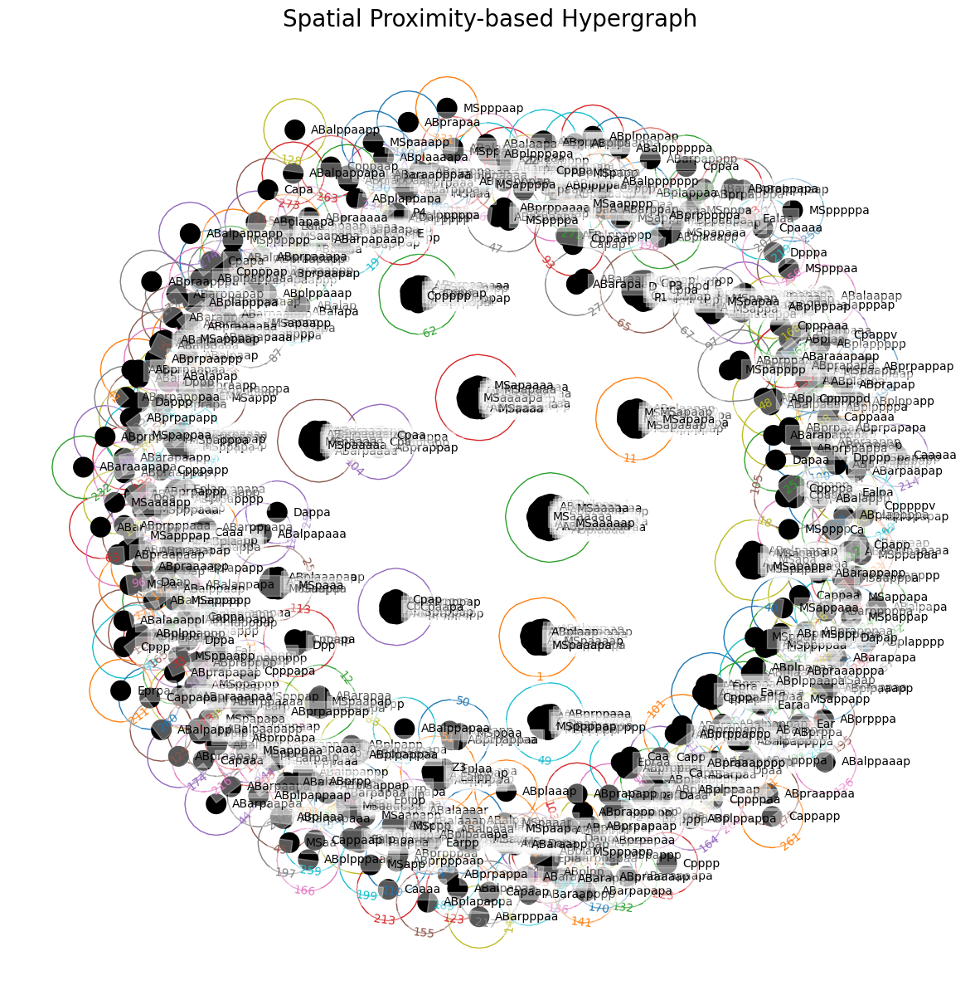

In [12]:
def visualize_hypergraph(H, title="Hypergraph Visualization", figsize=(15, 15)):
    """
    Visualize the hypergraph using HyperNetX's drawing capabilities.

    Args:
        H (hnx.Hypergraph): The hypergraph to visualize.
        title (str, optional): Title of the plot. Defaults to "Hypergraph Visualization".
        figsize (tuple, optional): Size of the matplotlib figure. Defaults to (15, 15).
    """
    plt.figure(figsize=figsize)
    hnx.draw(H)
    plt.title(title, fontsize=20)
    plt.show()


# Visualize spatial hypergraph
visualize_hypergraph(H_spatial, title="Spatial Proximity-based Hypergraph")

### 4.2 Lineage-based Hypergraph (Common Parent)
Grouping cells based on lineage provides insights into developmental pathways and cellular differentiation.

Function: **create_lineage_hypergraph**

In [13]:
def create_lineage_hypergraph(ce_data):
    """
    Create a hypergraph based on cell lineage relationships.

    Args:
        ce_data (pd.DataFrame): DataFrame containing 'cell' and 'mother' columns.

    Returns:
        hnx.Hypergraph: The lineage-based hypergraph.
    """
    lineage_dict = {}
    # Iterate over each cell and assign it to its mother's hyperedge
    for _, row in ce_data.iterrows():
        cell = row['cell']
        mother = row['mother']
        if pd.notnull(mother):
            if mother in lineage_dict:
                lineage_dict[mother].append(cell)
            else:
                lineage_dict[mother] = [cell]
        else:
            # Progenitor cells (without mothers) can form their own hyperedges
            lineage_dict[cell] = [cell]

    H_lineage = hnx.Hypergraph(lineage_dict)
    return H_lineage

**Creating the Lineage-based Hypergraph**

In [14]:
# Create hypergraph based on lineage
H_lineage = create_lineage_hypergraph(merged_df)

# Display hypergraph information
print("\nLineage-based Hypergraph Info:")
hnx.info_dict(H_lineage)


Lineage-based Hypergraph Info:


{'nrows': 786,
 'ncols': 398,
 'aspect ratio': 1.9748743718592965,
 'ncells': 786,
 'density': 0.002512562814070352}

**Visualizing the Lineage Hypergraph**

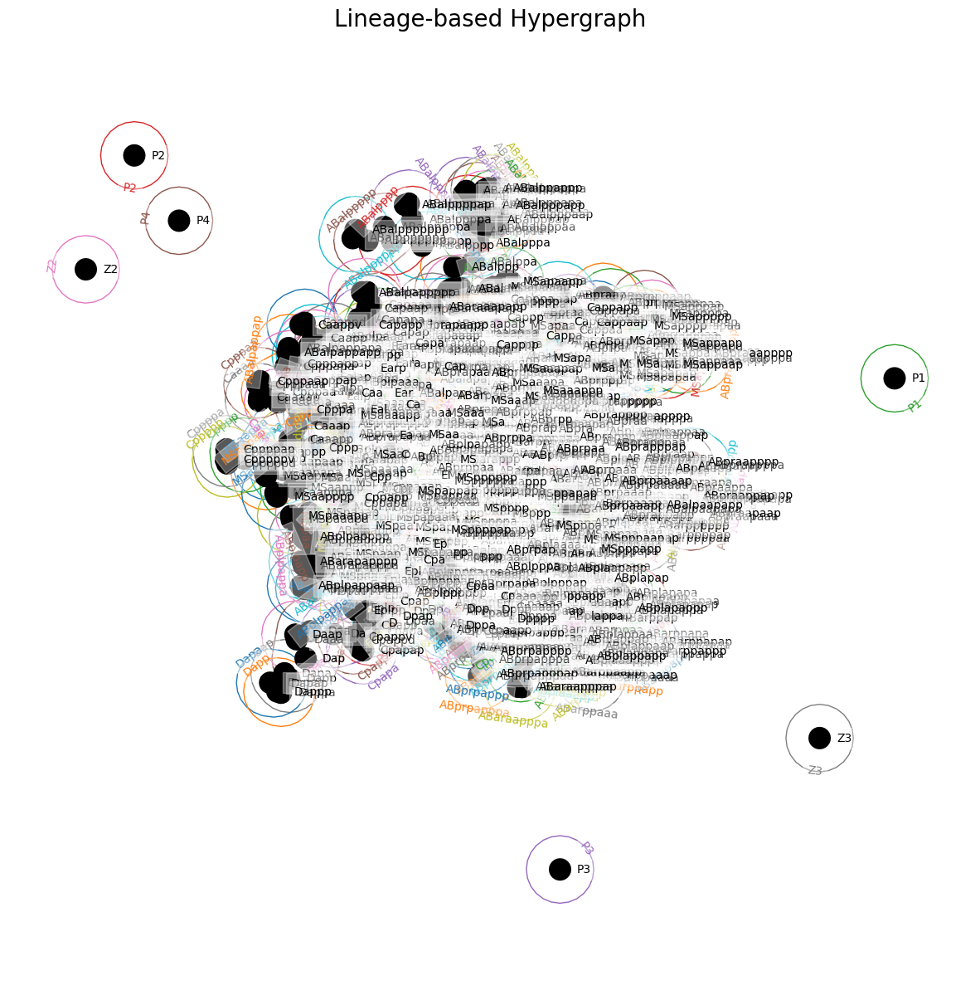

In [15]:
# Visualize lineage hypergraph
visualize_hypergraph(H_lineage, title="Lineage-based Hypergraph")

### 4.3 Distance Threshold-based Hypergraph
This method groups cells into hyperedges based on a specified distance threshold using their spatial coordinates. Any two cells within the threshold distance are connected through a hyperedge.

Function: **create_hypergraph_distance_threshold**

In [36]:
def create_hypergraph_distance_threshold(ce_data, threshold=50):
    """
    Create a hypergraph from cell positions based on the threshold distance.

    Args:
    - threshold: float, the maximum distance between two cells to form a hyperedge
    """
    # Corrected column names to match the DataFrame
    positions = ce_data[['x', 'y', 'z']].values
    num_cells = len(positions)
    nested_dict = {}
    # Group nodes by proximity
    for i in range(len(positions)):
        nested_dict[i] = [ce_data.iloc[i]['cell']]
        for j in range(i + 1, len(positions)):
            if np.linalg.norm(positions[i] - positions[j]) < threshold:
                nested_dict[i].append(ce_data.iloc[j]['cell'])

    H = hnx.Hypergraph(nested_dict)
    return H

**Creating the Distance Threshold-based Hypergraph**

In [37]:
# Define the distance threshold
distance_threshold = 50  # Adjust this value as needed

# Create hypergraph based on distance threshold
H_distance_threshold = create_hypergraph_distance_threshold(
    ce_data=merged_df,
    threshold=distance_threshold
)

# Display information about the distance threshold-based hypergraph
print("\nDistance Threshold-based Hypergraph Info:")
hnx.info_dict(H_distance_threshold)


Distance Threshold-based Hypergraph Info:


{'nrows': 786,
 'ncols': 786,
 'aspect ratio': 1.0,
 'ncells': 69171,
 'density': 0.11196414350368082}

**Visualizing the Distance Threshold-based Hypergraph**

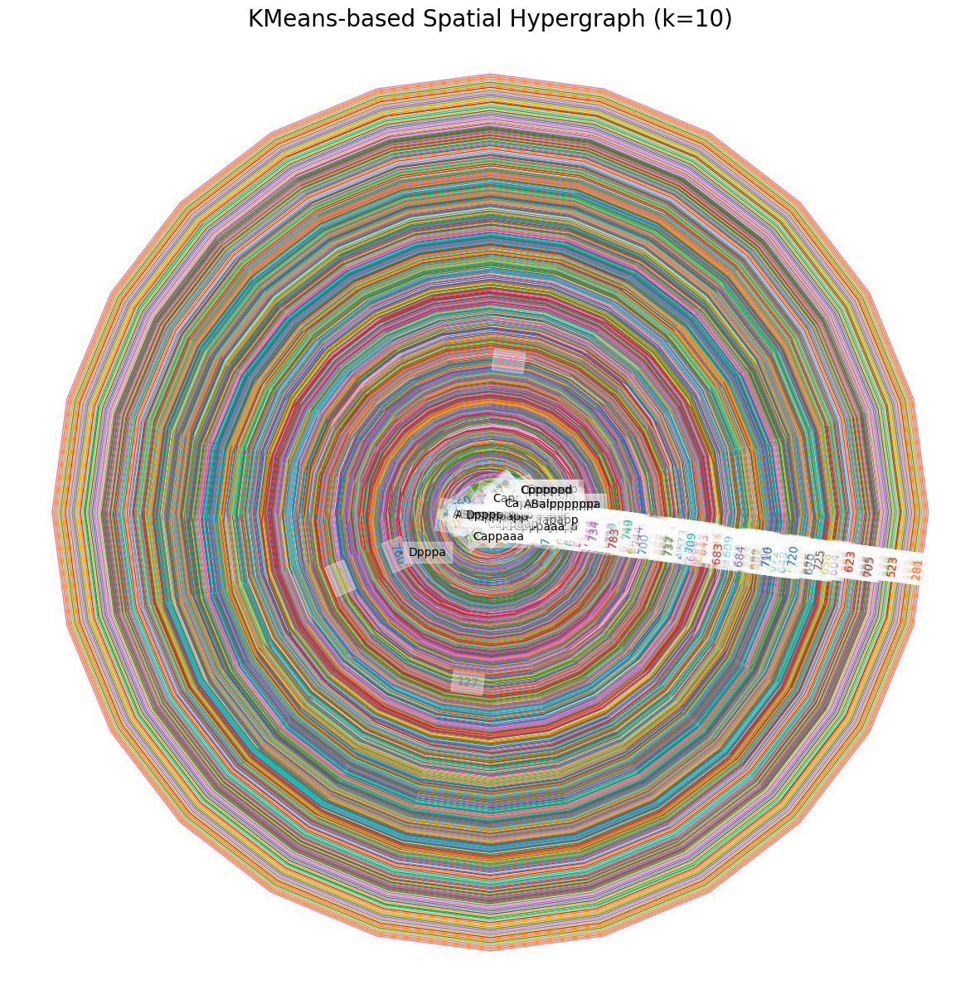

In [38]:
# Visualize KMeans hypergraph
visualize_hypergraph(
    H_distance_threshold, title=f"KMeans-based Spatial Hypergraph (k={n_clusters})")

## 5. Hypergraph Analysis Metrics

Analyzing hypergraphs involves computing various metrics that reveal structural properties and underlying patterns. We'll explore the following metrics:

- Degree Distribution
- Centrality Measures
- Connected Components
- Distance Metrics
- Hyperedge Size Distribution
- Node and Edge Betweenness
- Spectral Properties

### 5.1 Degree Distribution
The degree distribution of a hypergraph represents the frequency of nodes based on their degrees. In the context of hypergraphs, the degree of a node can be defined in various ways, such as the number of hyperedges a node participates in.

**Importance in C. elegans Data**
Understanding the degree distribution helps identify highly connected cells (hubs) and those with minimal interactions. In C. elegans development, hub cells may play critical roles in signaling pathways, differentiation processes, or structural integrity.

**Implementation**
We'll compute the s-degree for each node, where s defines the minimum size of hyperedges to consider. For example, setting s=2 means only hyperedges connecting at least two nodes are counted.
Function: compute_s_degree

In [28]:
def compute_s_degree(H, nodes=None, s=1, max_size=None, plot=True):
    """
    Compute the s-degree for specified nodes in the hypergraph.
    
    Args:
        H (hnx.Hypergraph): The hypergraph.
        nodes (list, optional): List of node identifiers. If None, selects 5 random nodes.
        s (int, optional): The minimum size of hyperedges to consider. Default is 1.
        max_size (int, optional): The maximum size of hyperedges to consider. Default is None.
        plot (bool, optional): Whether to plot the s-degree distribution. Default is True.
    
    Returns:
        dict: Dictionary mapping node identifiers to their s-degree.
    """
    import random

    # Ensure s is at least 1
    if s < 1:
        raise ValueError("Parameter 's' must be at least 1.")

    # If nodes are not provided, select 5 random nodes
    if nodes is None:
        nodes = random.sample(list(H.nodes), min(5, len(H.nodes)))
    else:
        # Validate that nodes exist in the hypergraph
        missing_nodes = [node for node in nodes if node not in H.nodes]
        if missing_nodes:
            raise ValueError(
                f"The following nodes are not in the hypergraph: {missing_nodes}")

    # Compute s-degree for each node
    s_degrees = {}
    for node in nodes:
        degree = H.degree(node_uid=node, s=s, max_size=max_size)
        s_degrees[node] = degree

    # Print the s-degrees
    print(f"\ns-Degree (s={s}) for specified nodes:")
    for node, degree in s_degrees.items():
        print(f"Node: {node}, s-Degree: {degree}")

    # Plotting
    if plot:
        plt.figure(figsize=(8, 6))
        plt.bar(s_degrees.keys(), s_degrees.values(),
                color='skyblue', edgecolor='black')
        plt.xlabel('Node')
        plt.ylabel(f's-Degree (s={s})')
        plt.title(f's-Degree of Nodes (s={s})')
        plt.xticks(rotation=45)
        plt.tight_layout()
        plt.show()

    return s_degrees


s-Degree (s=2) for specified nodes:
Node: AB, s-Degree: 1
Node: ABa, s-Degree: 1
Node: ABal, s-Degree: 1
Node: ABara, s-Degree: 1
Node: ABalaa, s-Degree: 1


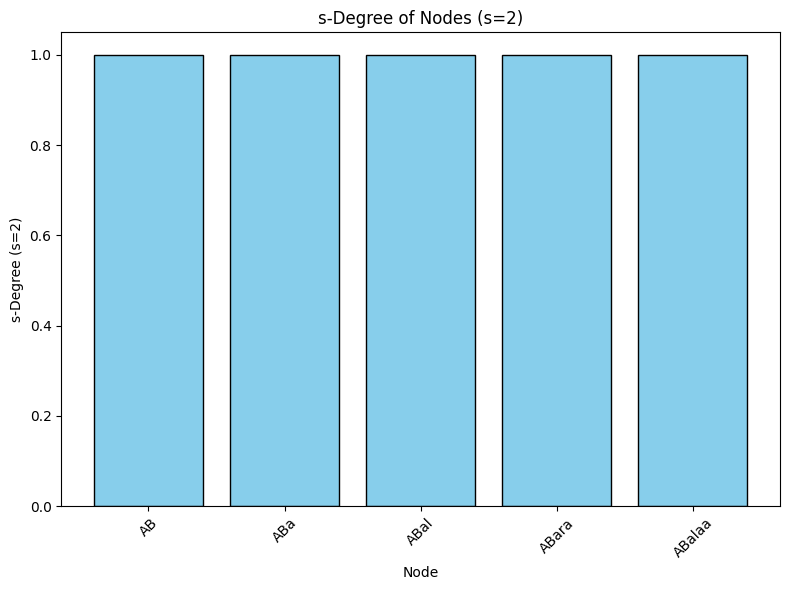


s-Degree (s=2) for specified nodes:
Node: AB, s-Degree: 0
Node: ABa, s-Degree: 1
Node: ABal, s-Degree: 1
Node: ABara, s-Degree: 1
Node: ABalaa, s-Degree: 1


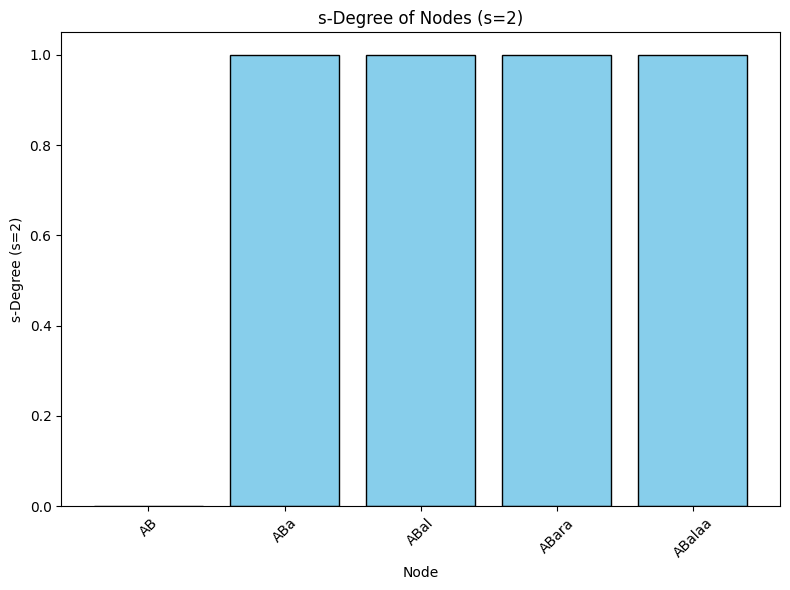


s-Degree (s=2) for specified nodes:
Node: AB, s-Degree: 1
Node: ABa, s-Degree: 2
Node: ABal, s-Degree: 2
Node: ABara, s-Degree: 38
Node: ABalaa, s-Degree: 4


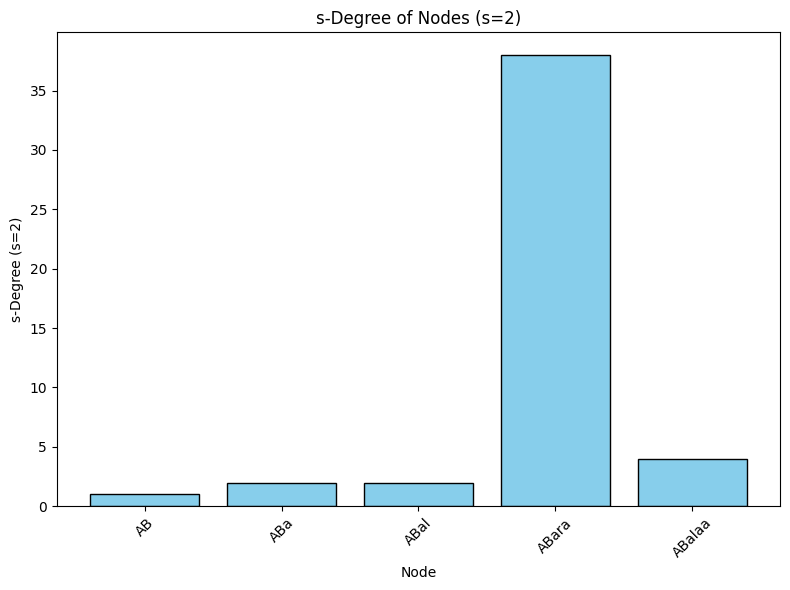

In [41]:
# Specify nodes to check
nodes_to_check = ['AB', 'ABa', 'ABal', 'ABara', 'ABalaa']
s_value = 2

# Compute s-degree for Spatial Proximity-based Hypergraph
s_degrees_spatial = compute_s_degree(
    H_spatial,
    nodes=nodes_to_check,
    s=s_value
)

# Compute s-degree for Lineage-based Hypergraph
s_degrees_lineage = compute_s_degree(
    H_lineage,
    nodes=nodes_to_check,
    s=s_value
)

# Compute s-degree for Distance Threshold-based Hypergraph
s_degrees_distance = compute_s_degree(
    H_distance_threshold,
    nodes=nodes_to_check,
    s=s_value
)

### 5.2 Hyperedge Size Distribution

**Definition**
The hyperedge size distribution illustrates the frequency of hyperedges based on their cardinality—the number of nodes they connect. It provides insights into the interaction complexity within the hypergraph.

**Importance in C. elegans Data**
Analyzing hyperedge sizes helps understand the nature of cell interactions:

Small Hyperedges (e.g., size 2): Indicate pairwise interactions, possibly representing direct cell-cell communication.
Large Hyperedges: Suggest group interactions, which might be crucial for coordinated developmental processes or structural formations.

**Implementation**
We'll compute and plot the distribution of hyperedge sizes for each hypergraph.

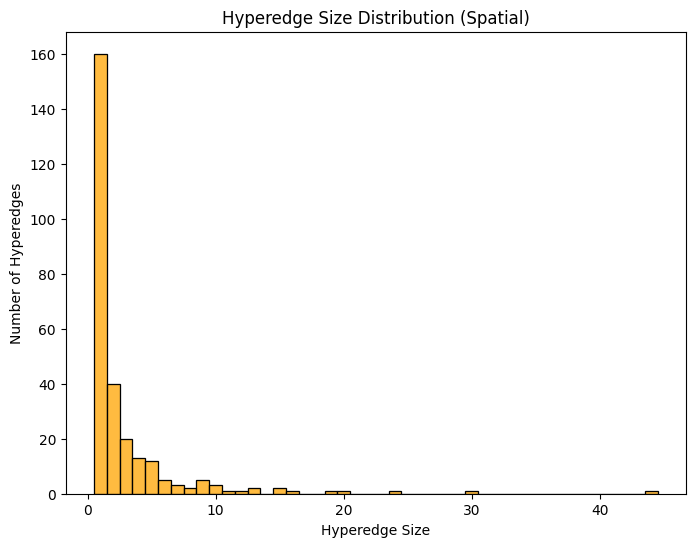

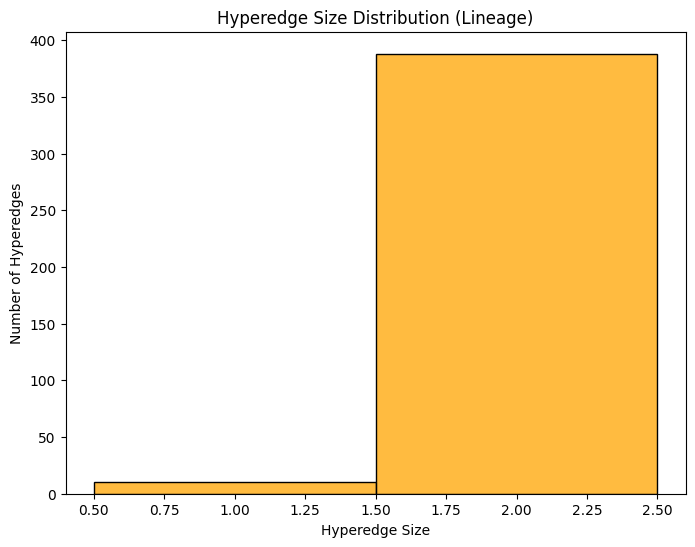

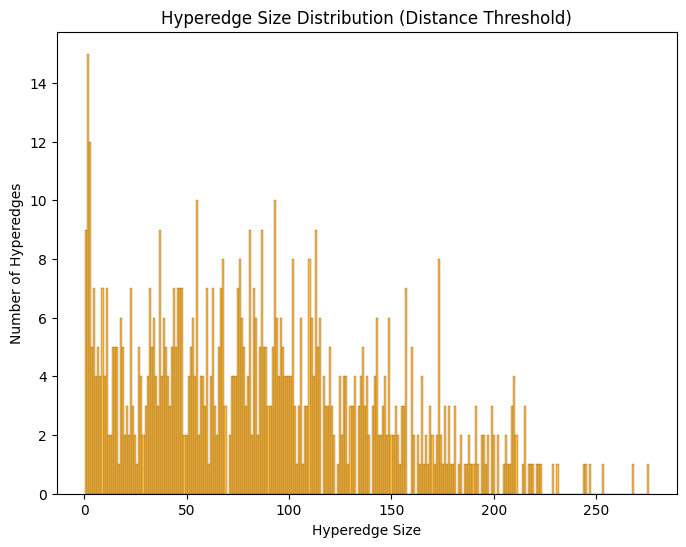

In [48]:
def plot_hyperedge_size_distribution(H, title_suffix=""):
    """
    Plot the distribution of hyperedge sizes in the hypergraph.
    
    Args:
        H (hnx.Hypergraph): The hypergraph.
        title_suffix (str, optional): Suffix for the plot title. Defaults to "".
    """
    # Get sizes of all hyperedges
    edge_sizes = [len(H.edges[edge]) for edge in H.edges]

    # Plotting the distribution
    plt.figure(figsize=(8, 6))
    sns.histplot(edge_sizes, bins=range(1, max(edge_sizes)+2),
                 color='orange', edgecolor='black', discrete=True)
    plt.xlabel('Hyperedge Size')
    plt.ylabel('Number of Hyperedges')
    plt.title(f'Hyperedge Size Distribution {title_suffix}')
    plt.show()


# Define the list of hypergraphs and their titles
hypergraphs = [
    (H_spatial, "Spatial"),
    (H_lineage, "Lineage"),
    (H_distance_threshold, "Distance Threshold")
]

# Plot hyperedge size distribution for each hypergraph
for H, title in hypergraphs:
    plot_hyperedge_size_distribution(H, title_suffix=f"({title})")

5.3 s-Adjacency Matrix

Definition
An s-adjacency matrix is a square matrix indexed by nodes where the entry *A_ij* is 1 if nodes *i* and *j* are s-adjacent (i.e., they share at least *s* hyperedges) and 0 otherwise.

**Importance in C. elegans Data**
The s-adjacency matrix quantifies the strength of connections between pairs of cells:

- High Connectivity: Cells frequently interacting through multiple hyperedges may be central to developmental pathways.
- Low Connectivity: Cells with few or no s-adjacent connections might have specialized or limited roles.

**Implementation**
We'll compute the s-adjacency matrix and visualize it as a heatmap.


s-Adjacency Matrix for Spatial Hypergraph (s=2):
             AB  ABaraappp  ABarapapaa  ABplaaaapp  MSaaappp  ABalpaapapa  \
AB            0          0           0           0         0            0   
ABaraappp     0          0           0           0         0            0   
ABarapapaa    0          0           0           0         0            0   
ABplaaaapp    0          0           0           0         0            0   
MSaaappp      0          0           0           0         0            0   
...          ..        ...         ...         ...       ...          ...   
ABalppppppa   0          0           0           0         0            0   
ABalppppppp   0          0           0           0         0            0   
MSaapppp      0          0           0           0         0            0   
ABalpappapa   0          0           0           0         0            0   
ABalpappapp   0          0           0           0         0            0   

             ABa  ABalaap

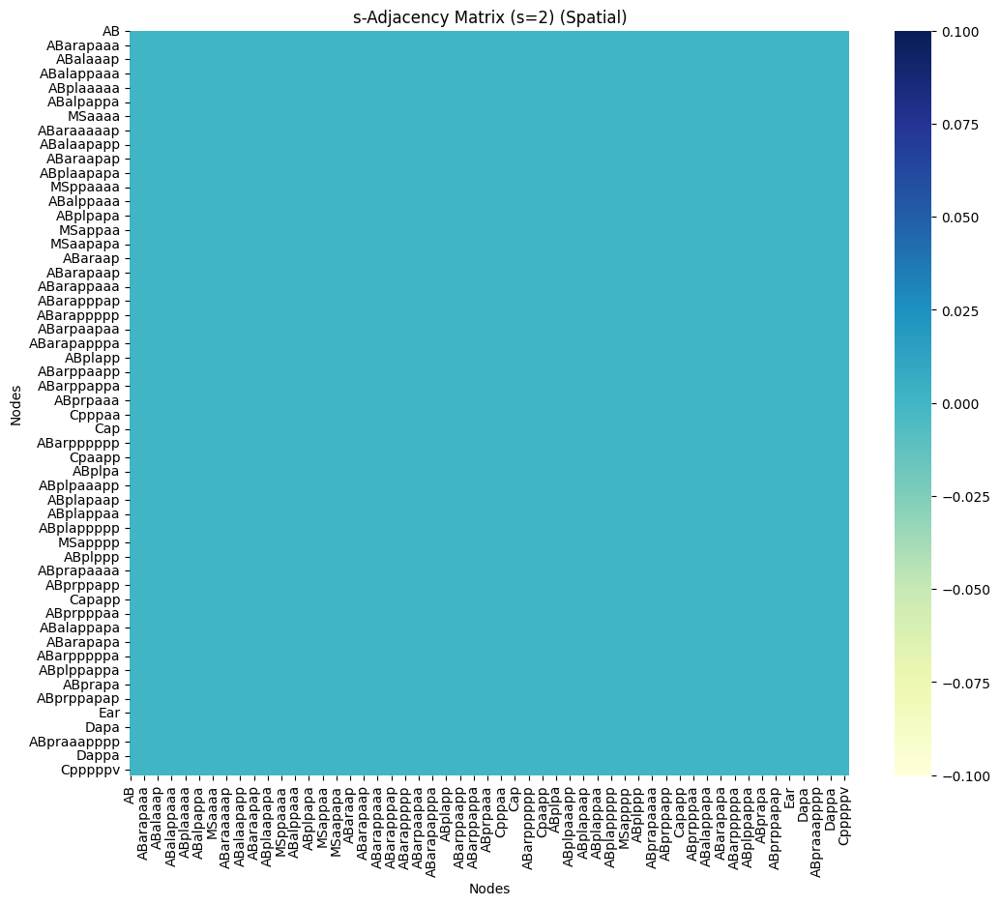


s-Adjacency Matrix for Lineage Hypergraph (s=2):
      AB  ABa  ABp  ABal  ABar  ABala  ABalp  ABalaa  ABalap  ABalaaa  ...  \
AB     0    0    0     0     0      0      0       0       0        0  ...   
ABa    0    0    0     0     0      0      0       0       0        0  ...   
ABp    0    0    0     0     0      0      0       0       0        0  ...   
ABal   0    0    0     0     0      0      0       0       0        0  ...   
ABar   0    0    0     0     0      0      0       0       0        0  ...   
...   ..  ...  ...   ...   ...    ...    ...     ...     ...      ...  ...   
P2     0    0    0     0     0      0      0       0       0        0  ...   
P3     0    0    0     0     0      0      0       0       0        0  ...   
P4     0    0    0     0     0      0      0       0       0        0  ...   
Z2     0    0    0     0     0      0      0       0       0        0  ...   
Z3     0    0    0     0     0      0      0       0       0        0  ...   

      MSaappp

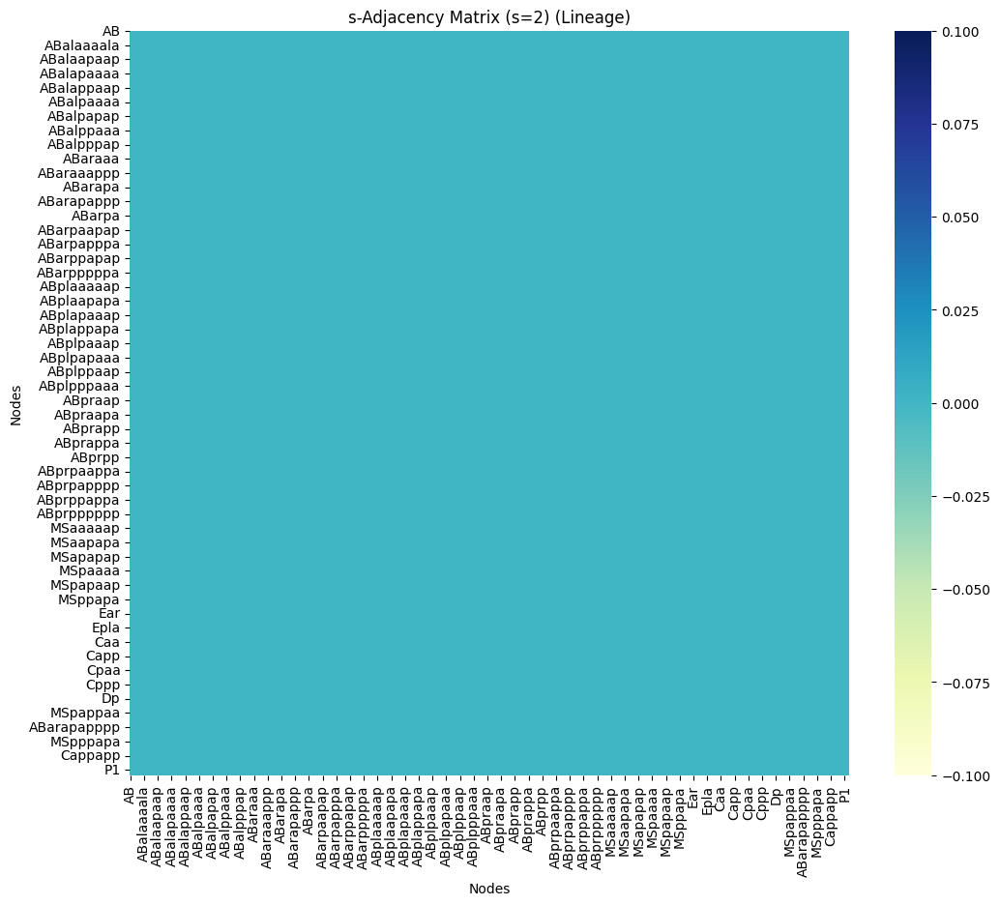


s-Adjacency Matrix for Distance Threshold Hypergraph (s=2):
             AB  ABa  ABalaapa  ABalaapaaa  ABalaapaap  ABalaapapa  \
AB            0    0         0           0           0           0   
ABa           0    0         1           1           1           1   
ABalaapa      0    1         0           1           1           1   
ABalaapaaa    0    1         1           0           1           1   
ABalaapaap    0    1         1           1           0           1   
...          ..  ...       ...         ...         ...         ...   
Cppppaa       0    0         0           0           0           0   
Cpppapp       0    0         0           0           0           0   
Cppppap       0    0         0           0           0           0   
Cpppppd       0    0         0           0           0           0   
ABalppppppa   0    0         0           0           0           0   

             ABalaapapp  ABalaapp  ABalaappap  ABalaappp  ...  Dpppa  Cappaaa  \
AB               

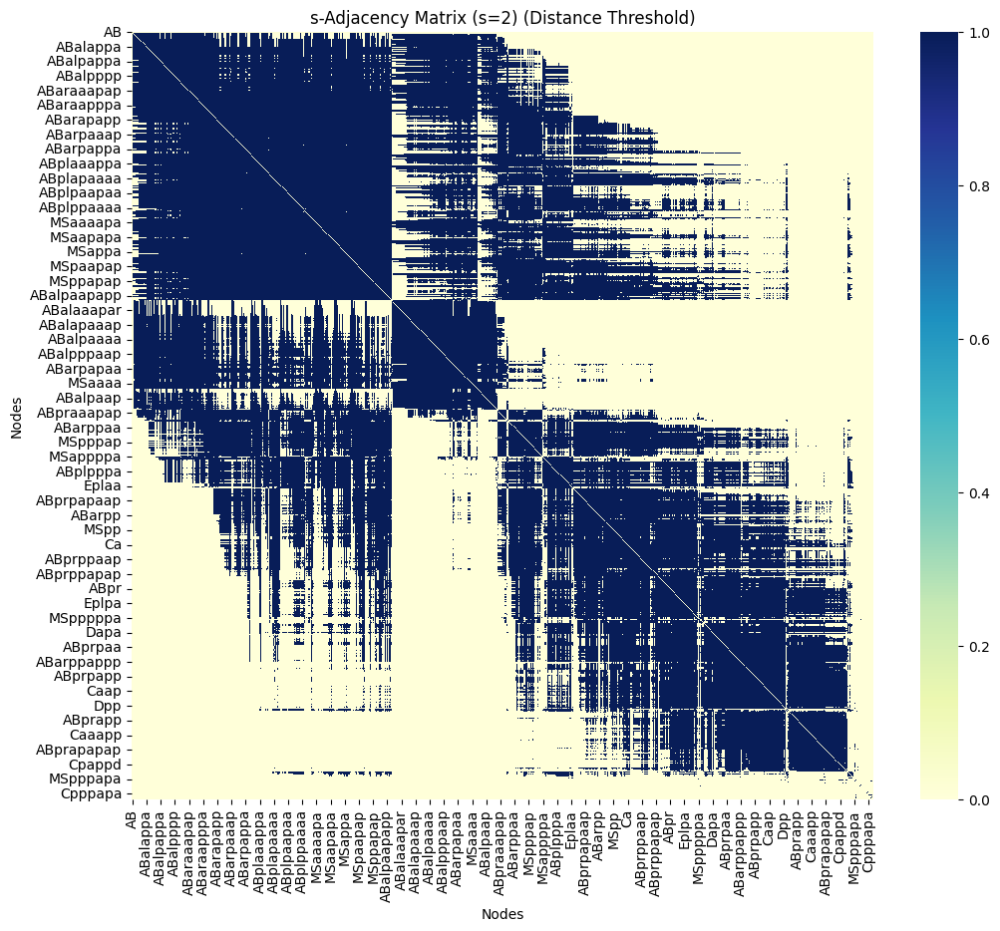

In [52]:
def compute_s_adjacency_matrix(H, s=1):
    """
    Compute the s-adjacency matrix for a hypergraph.
    
    Args:
        H (hnx.Hypergraph): The hypergraph.
        s (int): The s parameter for adjacency.
    
    Returns:
        pd.DataFrame: DataFrame representing the s-adjacency matrix.
    """
    nodes = list(H.nodes)
    node_index = {node: idx for idx, node in enumerate(nodes)}
    size = len(nodes)
    adj_matrix = np.zeros((size, size), dtype=int)

    # For each hyperedge, update the adjacency counts
    for edge in H.edges:
        members = list(H.edges[edge])
        for i in range(len(members)):
            for j in range(i + 1, len(members)):
                idx_i = node_index[members[i]]
                idx_j = node_index[members[j]]
                adj_matrix[idx_i][idx_j] += 1
                adj_matrix[idx_j][idx_i] += 1  # Symmetric

    # Apply the s threshold
    adj_matrix = (adj_matrix >= s).astype(int)

    adj_df = pd.DataFrame(adj_matrix, index=nodes, columns=nodes)
    return adj_df


def plot_s_adjacency_matrix(adj_df, s=1, title_suffix=""):
    """
    Plot the s-adjacency matrix as a heatmap.
    
    Args:
        adj_df (pd.DataFrame): The s-adjacency matrix.
        s (int): The s parameter.
        title_suffix (str): Suffix for the plot title.
    """
    plt.figure(figsize=(12, 10))
    sns.heatmap(adj_df, cmap="YlGnBu", cbar=True)
    plt.title(f's-Adjacency Matrix (s={s}) {title_suffix}')
    plt.xlabel("Nodes")
    plt.ylabel("Nodes")
    plt.show()


# Example Usage:
s_value = 2  # Define your s parameter

for H, title in [(H_spatial, "Spatial"), (H_lineage, "Lineage"), (H_distance_threshold, "Distance Threshold")]:
    adj_df = compute_s_adjacency_matrix(H, s=s_value)
    print(f"\ns-Adjacency Matrix for {title} Hypergraph (s={s_value}):")
    print(adj_df)
    plot_s_adjacency_matrix(adj_df, s=s_value, title_suffix=f"({title})")

### 5.4 s-Adjacent Node Graph

**Definition**
An s-adjacent node graph is a simple graph where nodes represent the original hypergraph nodes, and edges represent s-adjacent relationships (i.e., two nodes are connected if they share at least *s* hyperedges).

**Importance in C. elegans Data**

This graph simplifies the hypergraph structure to visualize direct relationships between cells based on their shared interactions. It helps in identifying tightly connected clusters and key connector cells.

**Implementation**

We'll create and visualize the s-adjacent node graph using NetworkX.


Number of edges in s-adjacent graph (Spatial, s=2): 0


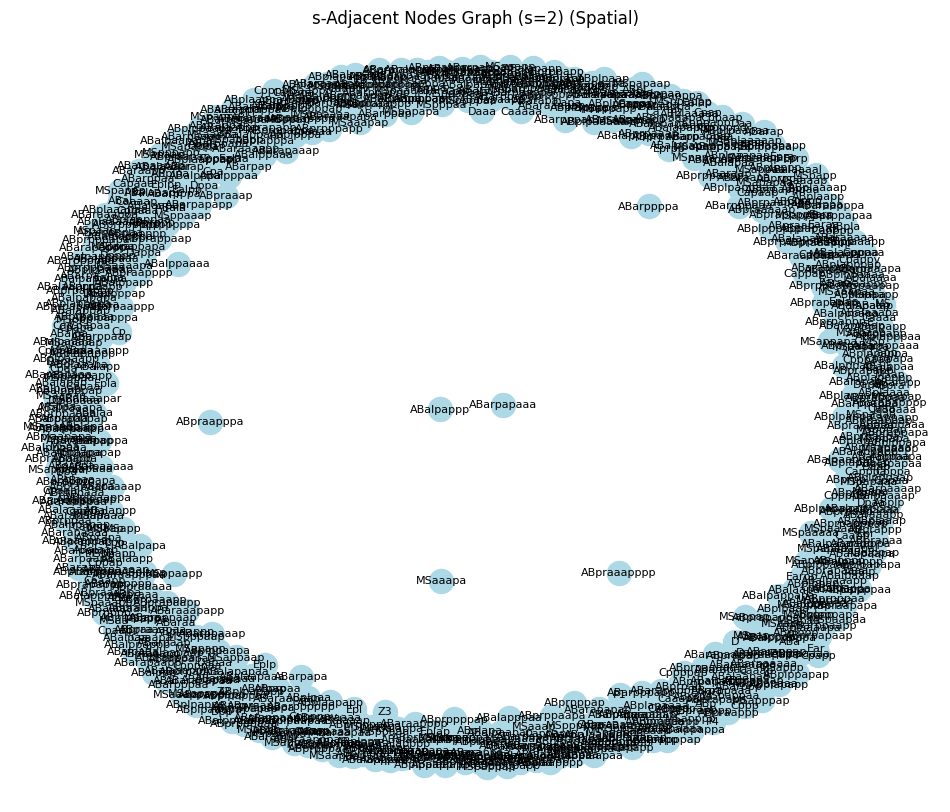


Number of edges in s-adjacent graph (Lineage, s=2): 0


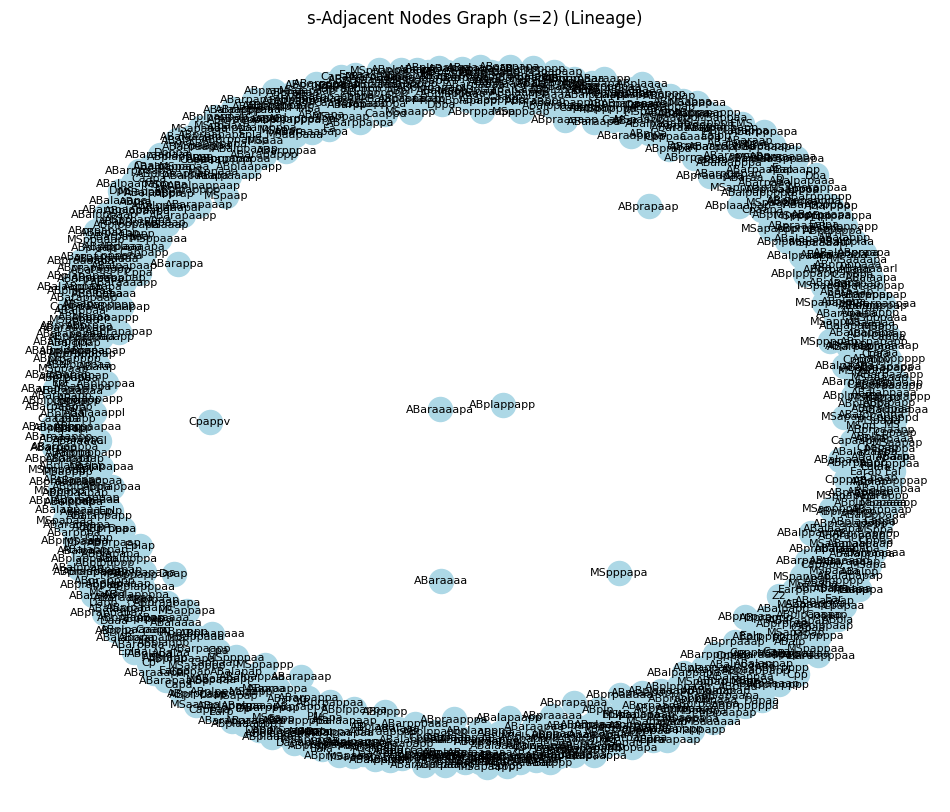


Number of edges in s-adjacent graph (Distance Threshold, s=2): 145052


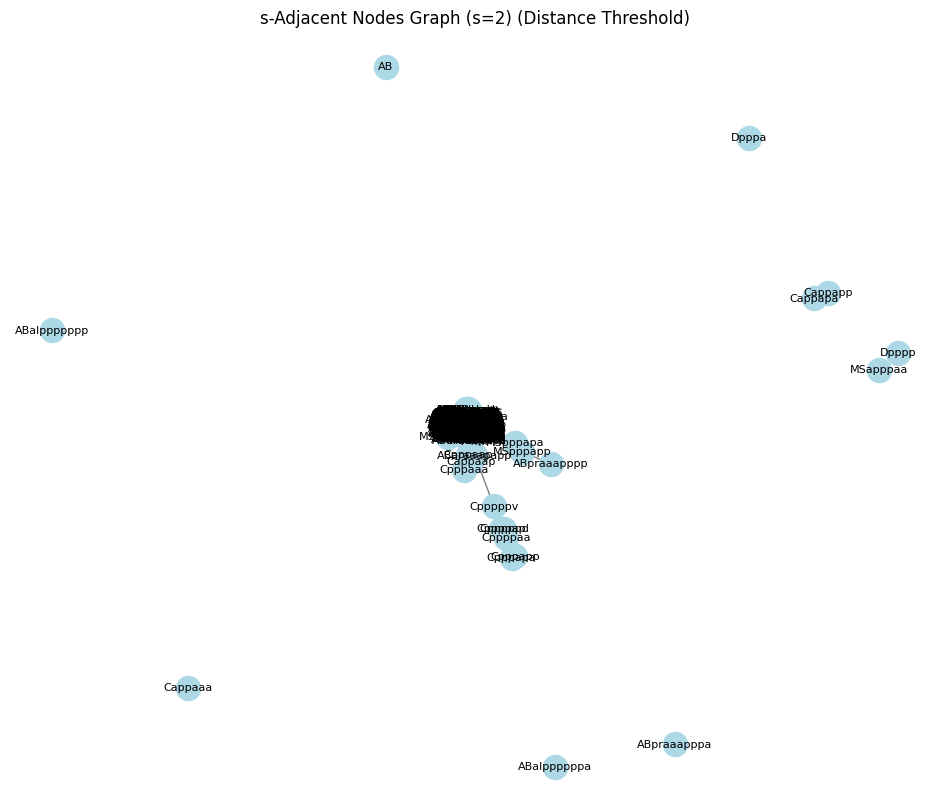

In [53]:
def create_s_adjacent_graph(H, s=1):
    """
    Create a graph where edges represent s-adjacent relationships between nodes.
    
    Args:
        H (hnx.Hypergraph): The hypergraph.
        s (int): The s parameter for adjacency.
    
    Returns:
        networkx.Graph: The s-adjacent graph.
    """
    adj_df = compute_s_adjacency_matrix(H, s=s)
    G_adj = nx.from_pandas_adjacency(adj_df)
    return G_adj


def plot_s_adjacent_graph(G, title_suffix=""):
    """
    Plot the s-adjacent graph.
    
    Args:
        G (networkx.Graph): The s-adjacent graph.
        title_suffix (str): Suffix for the plot title.
    """
    plt.figure(figsize=(12, 10))
    pos = nx.spring_layout(G, seed=42)  # For consistent layout
    nx.draw_networkx_nodes(G, pos, node_size=300, node_color='lightblue')
    nx.draw_networkx_edges(G, pos, alpha=0.5)
    nx.draw_networkx_labels(G, pos, font_size=8)
    plt.title(f's-Adjacent Nodes Graph (s={s_value}) {title_suffix}')
    plt.axis('off')
    plt.show()

# Example Usage:


for H, title in [(H_spatial, "Spatial"), (H_lineage, "Lineage"), (H_distance_threshold, "Distance Threshold")]:
    G_adj = create_s_adjacent_graph(H, s=s_value)
    print(
        f"\nNumber of edges in s-adjacent graph ({title}, s={s_value}): {G_adj.number_of_edges()}")
    plot_s_adjacent_graph(G_adj, title_suffix=f"({title})")

### 5.5 s-Edge-Adjacency Matrix and s-Linegraph
Definition

**s-Edge Adjacency Matrix:** A matrix representing connections between hyperedges based on their s-adjacent relationships. An entry *A_ij* is 1 if hyperedges  *E_i* and *E_j* are s-adjacent (i.e., they share at least *s* nodes) and 0 otherwise.

**s-Linegraph:** A graph derived from the hypergraph where each node represents a hyperedge, and edges represent s-adjacent relationships between hyperedges.

**Importance in C. elegans Data**

Analyzing the s-linegraph provides a meta-perspective of the hypergraph, focusing on how groups of cells (hyperedges) interact with each other. It can reveal clusters of hyperedges that frequently interact, indicating coordinated cellular functions.

**Implementation**

We'll compute the s-edge adjacency matrix and generate the s-linegraph.


Computing s-Edge-Adjacency Matrix and s-Linegraph for Spatial Hypergraph:
s-Edge-Adjacency Matrix for Spatial Hypergraph (s=2):

Number of edges in s-Linegraph (Spatial, s=2): 0


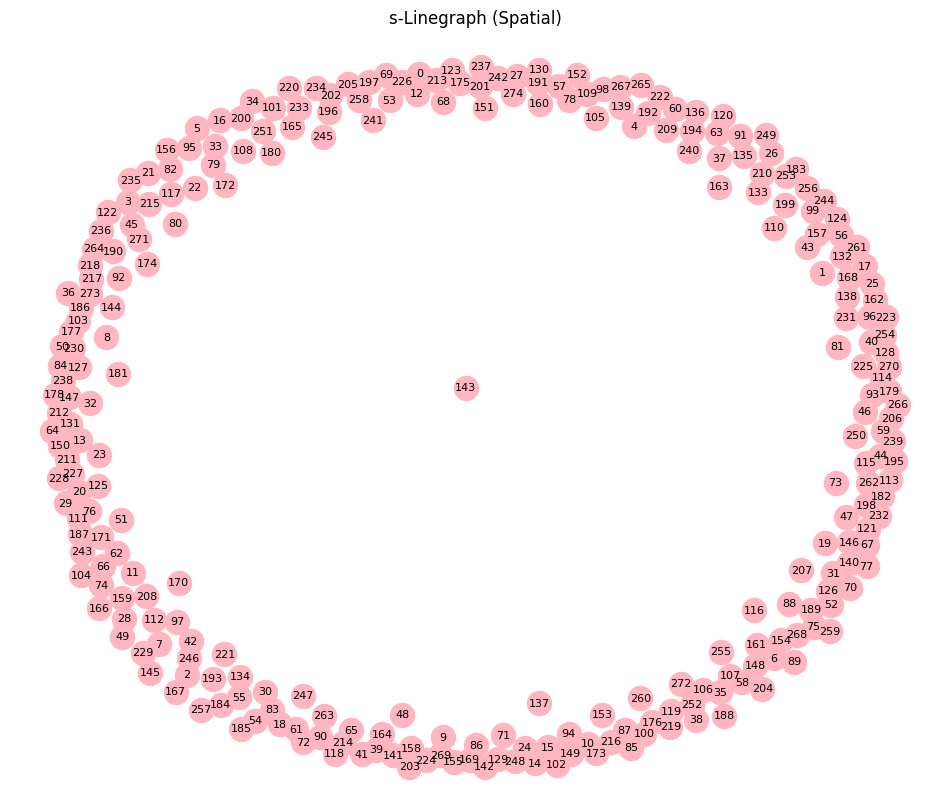


Computing s-Edge-Adjacency Matrix and s-Linegraph for Lineage Hypergraph:
s-Edge-Adjacency Matrix for Lineage Hypergraph (s=2):

Number of edges in s-Linegraph (Lineage, s=2): 0


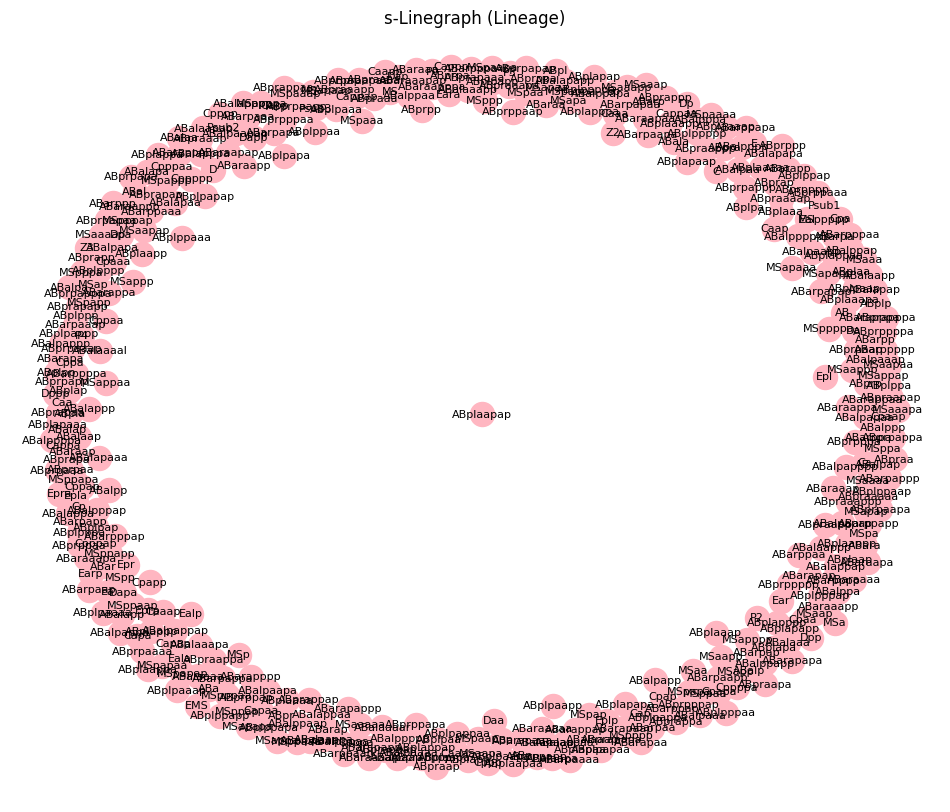


Computing s-Edge-Adjacency Matrix and s-Linegraph for Distance Threshold Hypergraph:
s-Edge-Adjacency Matrix for Distance Threshold Hypergraph (s=2):

Number of edges in s-Linegraph (Distance Threshold, s=2): 144794


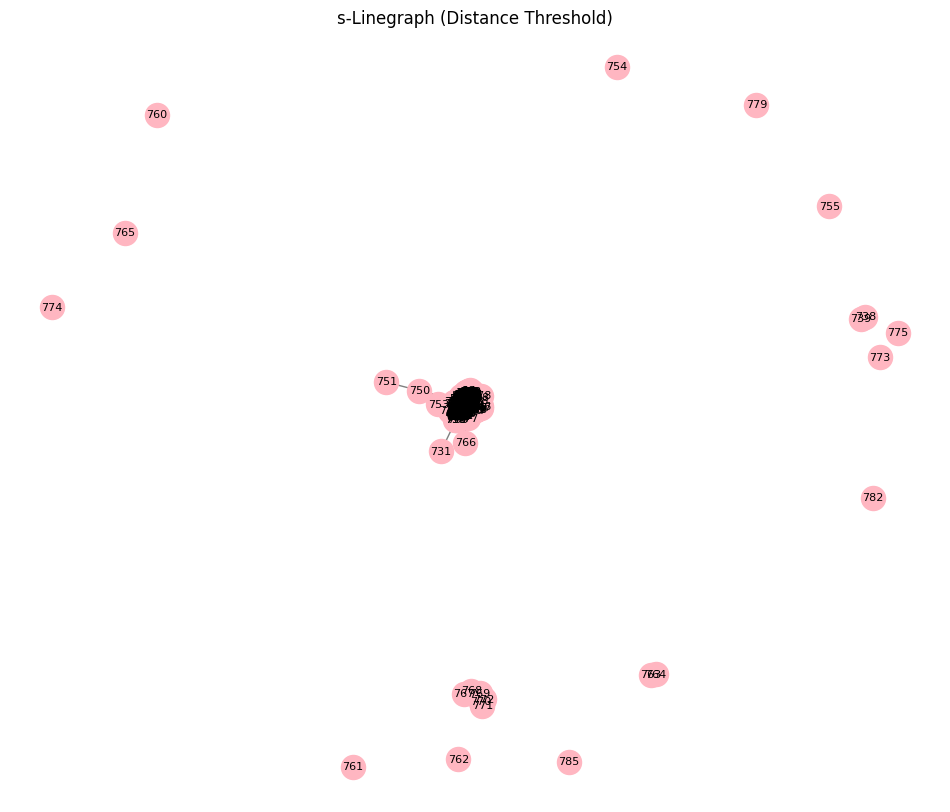

In [64]:
def compute_s_edge_adjacency_matrix(H, s=1):
    """
    Compute the s-edge-adjacency matrix for the hypergraph's dual.
    
    Args:
        H (hnx.Hypergraph): The hypergraph.
        s (int): The s parameter.
    
    Returns:
        pd.DataFrame: The s-edge-adjacency matrix.
    """
    # Create the dual hypergraph
    H_dual = H.dual()

    # Compute s-adjacency matrix for edges (which are nodes in the dual)
    adj_df = compute_s_adjacency_matrix(H_dual, s=s)
    return adj_df

def create_s_linegraph(H, s=1):
    """
    Create the s-linegraph for the hypergraph.
    
    Args:
        H (hnx.Hypergraph): The hypergraph.
        s (int): The s parameter.
    
    Returns:
        networkx.Graph: The s-linegraph.
    """
    adj_df = compute_s_edge_adjacency_matrix(H, s=s)
    G_line = nx.from_pandas_adjacency(adj_df)
    return G_line


def plot_s_linegraph(G_line, title_suffix=""):
    """
    Plot the s-linegraph.
    
    Args:
        G_line (networkx.Graph): The s-linegraph.
        title_suffix (str): Suffix for the plot title.
    """
    plt.figure(figsize=(12, 10))
    pos = nx.spring_layout(G_line, seed=42)
    nx.draw_networkx_nodes(G_line, pos, node_size=300, node_color='lightpink')
    nx.draw_networkx_edges(G_line, pos, alpha=0.5)
    nx.draw_networkx_labels(G_line, pos, font_size=8)
    plt.title(f's-Linegraph {title_suffix}')
    plt.axis('off')
    plt.show()

# Example Usage:


s_value = 2  # Define your s parameter

for H, title in [(H_spatial, "Spatial"), (H_lineage, "Lineage"), (H_distance_threshold, "Distance Threshold")]:
    print(
        f"\nComputing s-Edge-Adjacency Matrix and s-Linegraph for {title} Hypergraph:")
    adj_df = compute_s_edge_adjacency_matrix(H, s=s_value)
    print(f"s-Edge-Adjacency Matrix for {title} Hypergraph (s={s_value}):")

    # Create and plot s-linegraph
    G_line = create_s_linegraph(H, s=s_value)
    print(
        f"\nNumber of edges in s-Linegraph ({title}, s={s_value}): {G_line.number_of_edges()}")
    plot_s_linegraph(G_line, title_suffix=f"({title})")

## Additional Metrics
### Simple Hypergraph
A simple hypergraph is one in which no hyperedge is entirely contained within another hyperedge.


**Additional Metrics** (Future Implementation)
### 5.1 Centrality Measures

**Definition**

Centrality measures quantify the importance or influence of nodes within a hypergraph. Common centrality metrics include:

**Degree Centrality:** Number of hyperedges a node participates in.

**Betweenness Centrality:** Frequency at which a node appears on the shortest paths between other nodes.

**Closeness Centrality:** How close a node is to all other nodes in the hypergraph.

**Eigenvector Centrality:** Influence of a node based on the importance of its neighbors.

**Importance in C. elegans Data**

Understanding centrality measures in C. elegans hypergraphs aids in identifying key cells that play pivotal roles in development and spatial organization:

**High Degree Centrality:** Cells with numerous interactions may act as hubs, facilitating communication and coordination.
**High Betweenness Centrality:** Cells that bridge different regions or lineages can be critical for integrating diverse developmental pathways.
**High Closeness Centrality:** Cells that can quickly influence or be influenced by others may be essential for rapid developmental responses.
**High Eigenvector Centrality:** Cells connected to other influential cells might be integral to maintaining structural integrity or orchestrating complex processes.

Application Examples

**Spatial Data:** Identifying cells that interact with multiple neighboring cells, indicating regions of high cellular activity or structural importance.
**Lineage Data:** Pinpointing cells that connect different developmental lineages, highlighting points of convergence in cell differentiation pathways.

### 5.2 Connected Components

**Definition**

A connected component in a hypergraph is a subset of nodes where each pair of nodes is connected via an s-walk—a sequence of nodes connected through shared hyperedges based on a parameter *s*. An s-connected hypergraph has only one connected component.

**Importance in C. elegans Data**

Analyzing connected components helps in understanding the modular structure of cellular interactions:

**Isolated Clusters:** Indicate groups of cells that interact predominantly within themselves, possibly forming functional modules.

**Single Connected Component:** Suggests a highly integrated cellular network with pervasive interactions.

**Multiple Components:** May reflect distinct spatial regions or divergent developmental lineages with limited cross-interactions.

**Application Examples**

**Spatial Data:** Detecting clusters of cells that form specific anatomical structures.

**Lineage Data:** Identifying separate developmental paths or branches within the organism's growth.

### 5.3 Distance Metrics

**Definition**

Distance metrics in hypergraphs quantify the "distance" between nodes or edges based on s-walks:

**s-Distance:** The length of the shortest s-walk between two nodes.

**s-Diameter:** The maximum s-distance across all pairs of nodes in the hypergraph.

An s-walk is a sequence of nodes where each consecutive pair is connected through at least *s* shared hyperedges.

**Importance in C. elegans Data**

Distance metrics provide insights into the overall connectivity and efficiency of information flow within the cellular network:

**Short s-Distances:** Indicate efficient communication pathways, allowing rapid coordination among cells.

**Long s-Distances:** May reveal bottlenecks or regions of limited connectivity, potentially highlighting areas requiring further investigation.

**s-Diameter:** Offers a measure of the hypergraph's overall connectivity and robustness.

**Application Examples**

**Spatial Data:** Assessing how quickly signals or structural changes can propagate across the organism.

**Lineage Data:** Understanding the extent to which different developmental paths are interconnected.

### 5.4 Hyperedge Size Distribution

**Definition**

The hyperedge size distribution illustrates the frequency of hyperedges based on their cardinality—the number of nodes they connect. It reveals the complexity and scale of interactions within the hypergraph.

**Importance in C. elegans Data**

Analyzing hyperedge sizes sheds light on the nature of cellular interactions:

**Small Hyperedges (e.g., size 2):** Represent pairwise interactions, such as direct cell-cell communication or signaling.
Large Hyperedges: Indicate group interactions, potentially involved in coordinated developmental processes or structural formations.
Application Examples

**Spatial Data:** Differentiating between localized pairwise interactions and broader group dynamics in forming anatomical structures.

**Lineage Data:** Understanding the extent of collaboration among cells during differentiation and development.

### 5.5 Node and Edge Betweenness

**Definition**

Betweenness centrality measures the extent to which a node or edge lies on paths between other nodes or edges. It quantifies the role of a node or edge as a bridge within the hypergraph.

**Node Betweenness Centrality:** How often a node appears on the shortest paths between other nodes.

**Edge Betweenness Centrality:** How often an edge appears on the shortest paths between node pairs.

*Importance in C. elegans Data*

Betweenness centrality helps identify critical connectors that facilitate communication and integration within the cellular network:

**High Node Betweenness:** Cells that connect disparate regions or lineages, playing crucial roles in coordination and integration.

**High Edge Betweenness:** Connections that serve as bridges between different groups of cells, essential for maintaining network cohesion.

**Application Examples**

**Spatial Data:** Identifying key cells that link different anatomical regions, essential for coordinated structural development.

**Lineage Data:** Highlighting connections between different developmental pathways, ensuring synchronized differentiation processes.

### 5.6 Spectral Properties

**Definition**

Spectral properties involve analyzing the eigenvalues and eigenvectors of matrices associated with the hypergraph, such as the adjacency matrix or Laplacian matrix. These properties provide insights into the hypergraph's connectivity, robustness, and dynamic behaviors.

**Importance in C. elegans Data**

Spectral analysis reveals deep structural characteristics of the hypergraph:

**Eigenvalues:** Indicate connectivity levels, presence of clusters, and potential bottlenecks.

**Eigenvectors:** Can be used for community detection, identifying modules or functional groups within the cellular network.

**Spectral Gap:** The difference between consecutive eigenvalues, providing information about the hypergraph's robustness and resilience to perturbations.

**Application Examples**

**Spatial Data:** Detecting communities of cells that form functional or structural modules.

**Lineage Data:** Identifying patterns of differentiation and integration across different developmental branches.

## 6. Visualizing the graph

### 6.1 Dual Hypergraph
The dual hypergraph swaps the roles of nodes and hyperedges.



In [81]:
# Create the dual hypergraph
H_spatial_dual = H_spatial.dual()

# Check the dual hypergraph
print(f"Original Hypergraph Nodes: {
      len(H_spatial.nodes)}, Edges: {len(H_spatial.edges)}")
print(f"Dual Hypergraph Nodes: {len(H_spatial_dual.nodes)}, Edges: {
      len(H_spatial_dual.edges)}")

Original Hypergraph Nodes: 786, Edges: 275
Dual Hypergraph Nodes: 275, Edges: 786


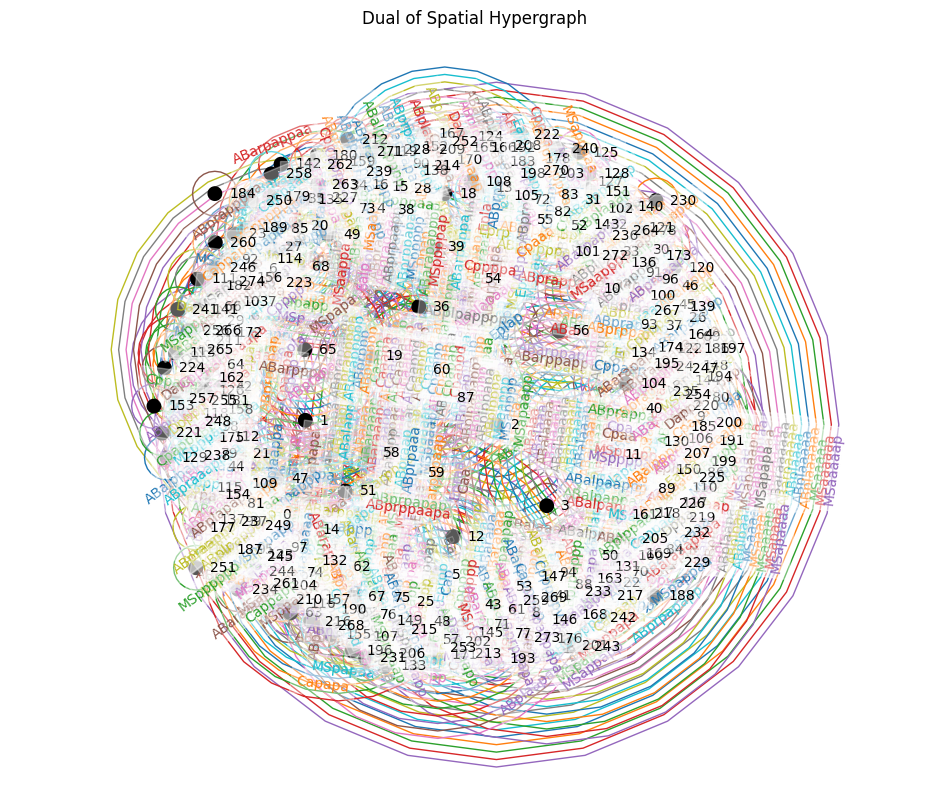

In [82]:
# Visualize the dual hypergraph
plt.figure(figsize=(12, 10))
hnx.draw(H_spatial_dual, with_node_labels=True)
plt.title('Dual of Spatial Hypergraph')
plt.show()

### 6.2 Visualizing Connected Components
Subparts of a dual graph

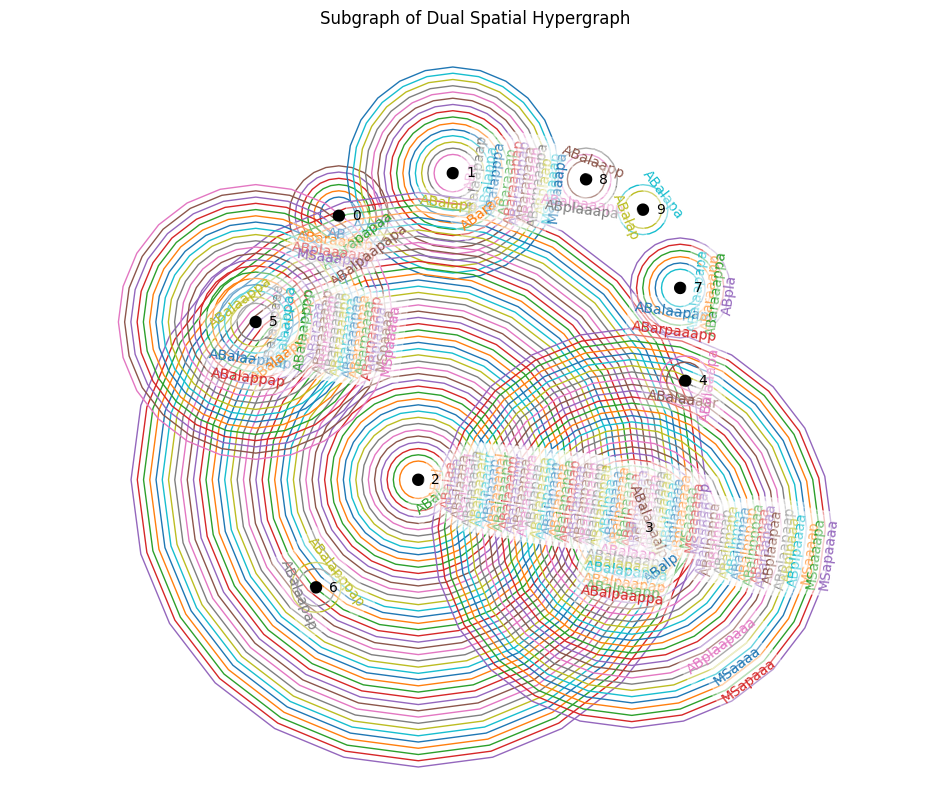

In [83]:
# Extract a sub-hypergraph with specific nodes
sub_nodes = list(H_spatial_dual.nodes)[:10]  # First 10 nodes
H_spatial_dual_sub = H_spatial_dual.restrict_to_nodes(sub_nodes)

# Visualize the sub-hypergraph
plt.figure(figsize=(12, 10))
hnx.draw(H_spatial_dual_sub, with_node_labels=True)
plt.title('Subgraph of Dual Spatial Hypergraph')
plt.show()

### 6.1 Visualizing Dual Hypergraphs

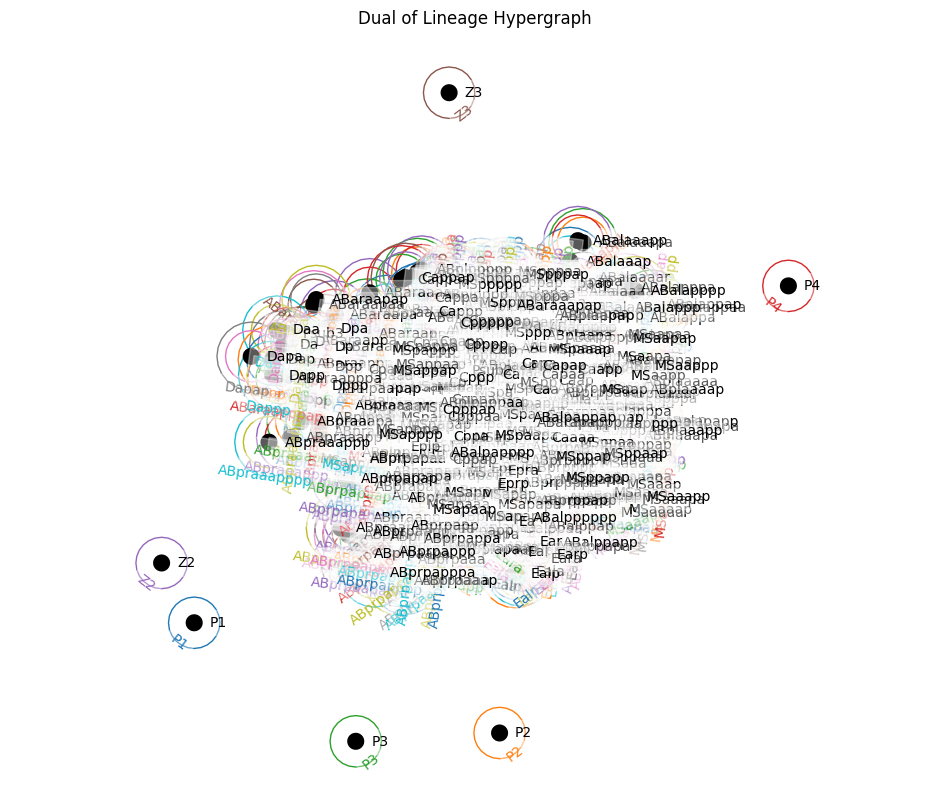

In [86]:
# Create the dual hypergraph
H_lineage_dual = H_lineage.dual()

# Visualize the dual hypergraph
plt.figure(figsize=(12, 10))
hnx.draw(H_lineage_dual, with_node_labels=True)
plt.title('Dual of Lineage Hypergraph')
plt.show()

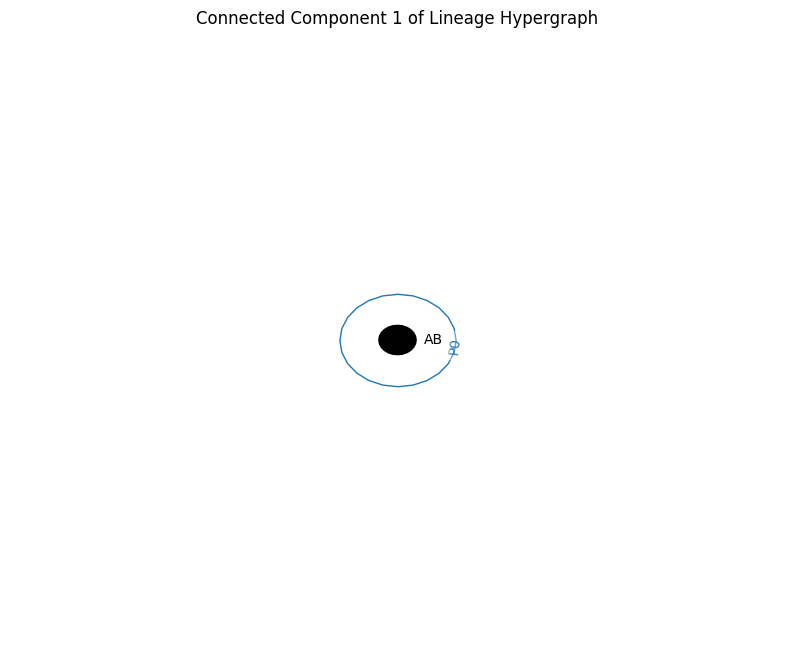

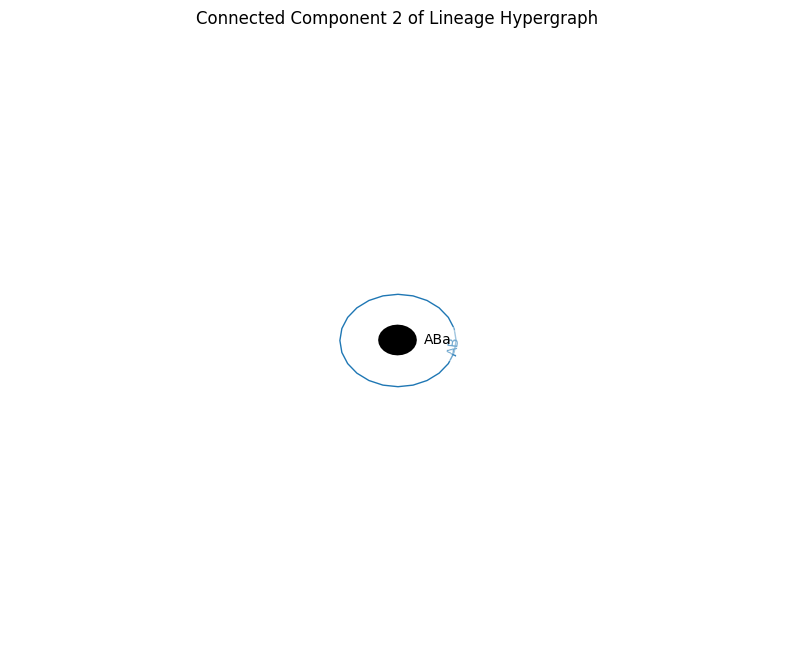

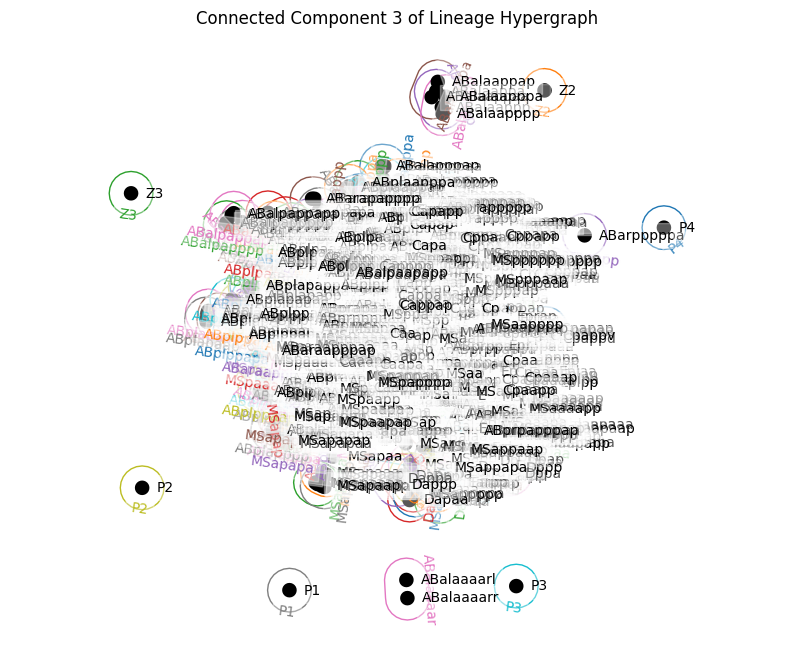

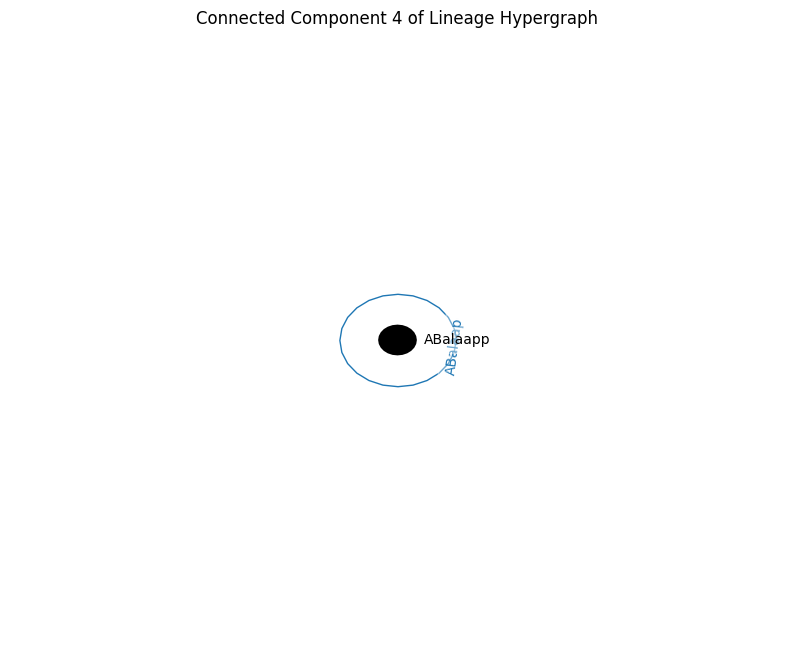

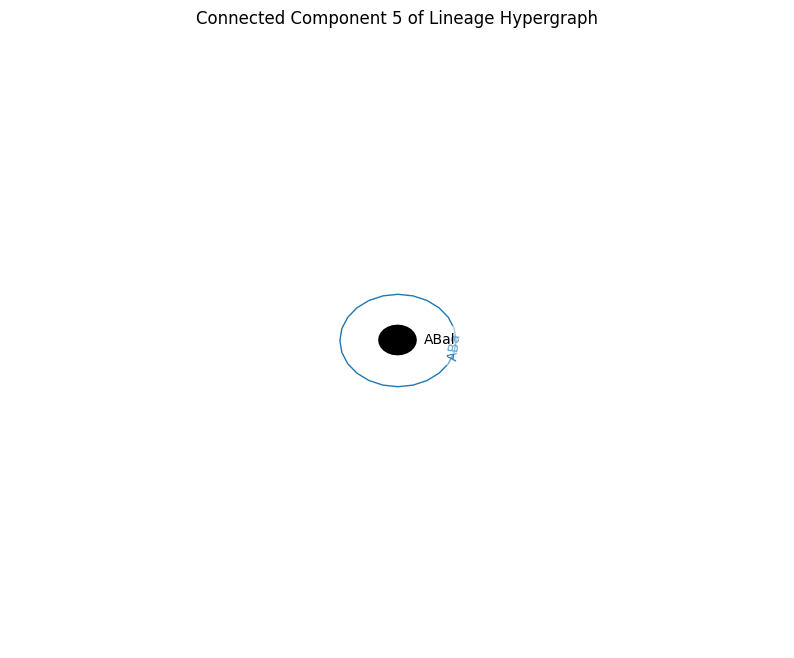

In [88]:
# Visualize the connected components
for i, component in enumerate(components):
    if i >= 5:
        break  # Limit to first 5 components
    H_sub = H_lineage.restrict_to_nodes(component)
    plt.figure(figsize=(10, 8))
    hnx.draw(H_sub, with_node_labels=True)
    plt.title(f'Connected Component {i+1} of Lineage Hypergraph')
    plt.show()

In [89]:
def visualize_hypergraph_components(H, pos=None, clusters=None, title_prefix='Hypergraph'):
    """
    Visualize the hypergraph, its dual, and its connected components.
    
    Args:
        H (hnx.Hypergraph): The hypergraph to visualize.
        pos (dict, optional): Positions of nodes for plotting.
        clusters (dict, optional): Cluster assignments for coloring nodes.
        title_prefix (str): Prefix for plot titles.
    """
    # Visualize the hypergraph
    plt.figure(figsize=(12, 10))
    node_colors = None
    if clusters:
        unique_clusters = list(set(clusters.values()))
        color_map = {cluster: plt.cm.tab20(
            i % 20) for i, cluster in enumerate(unique_clusters)}
        node_colors = [color_map[clusters[node]] for node in H.nodes]
    hnx.draw(H, pos=pos, with_node_labels=True, node_color=node_colors)
    plt.title(f'{title_prefix}')
    plt.show()

    # Visualize the dual hypergraph
    H_dual = H.dual()
    plt.figure(figsize=(12, 10))
    hnx.draw(H_dual, with_node_labels=True)
    plt.title(f'Dual of {title_prefix}')
    plt.show()

    # Visualize connected components
    connected_components_list = list(hnx.connected_components(H))
    print(f"Number of connected components: {len(connected_components_list)}")
    for i, component in enumerate(connected_components_list):
        if i >= 5:
            # Limit the number of components visualized
            break
        H_sub = H.restrict_to_nodes(component)
        plt.figure(figsize=(10, 8))
        hnx.draw(H_sub, with_node_labels=True)
        plt.title(f'{title_prefix} - Connected Component {i+1}')
        plt.show()